In [1]:
%matplotlib inline

# 1) Wipe out your namespace
%reset -f

# 2) Clear Jupyter’s stored outputs (and inputs if you like)
try:
    Out.clear() 
except NameError:
    pass

try:
    In.clear()
except NameError:
    pass

# 3) Force Python GC
import gc
gc.collect()

# 4) Free any GPU buffers
import torch
if torch.cuda.is_available():
    torch.cuda.empty_cache()

# 5) remove checkpoints
# import os; _ = [os.remove(p) for p in __import__("glob").glob("libs/.ipynb_checkpoints/*.py") if os.path.exists(p)]


import importlib
from libs import trades, plots, params, feats, strategies
importlib.reload(trades)
importlib.reload(plots)
importlib.reload(params)
importlib.reload(feats)
importlib.reload(strategies)

<module 'libs.strategies' from '/workspace/my_models/Trading/_Stock_Analysis_/libs/strategies.py'>

In [2]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
import seaborn as sns

import glob
import json
import re
import os
import psutil

import time
import datetime as dt
from tqdm.auto import tqdm
from IPython.display import clear_output, display

,open,high,low,close,volume,trade_count,vwap,ask,bid,ret,log_ret,sma_5,sma_pct_5,sma_9,sma_pct_9,sma_21,sma_pct_21,sma_50,sma_pct_50,sma_100,sma_pct_100,sma_200,sma_pct_200,ema_9,ema_21,ema_50,roc_5,roc_10,roc_21,body,body_pct,upper_shad,lower_shad,range_pct,rsi_6,rsi_14,rsi_21,macd_line_6_13_5,macd_signal_6_13_5,macd_diff_6_13_5,macd_line_12_26_9,macd_signal_12_26_9,macd_diff_12_26_9,atr_7,atr_pct_7,atr_14,atr_pct_14,atr_28,atr_pct_28,plus_di_7,minus_di_7,adx_7,plus_di_14,minus_di_14,adx_14,plus_di_28,minus_di_28,adx_28,bb_lband_20_2p0,bb_hband_20_2p0,bb_w_20_2p0,bb_lband_20_3p0,bb_hband_20_3p0,bb_w_20_3p0,bb_lband_50_2p0,bb_hband_50_2p0,bb_w_50_2p0,obv,vol_spike_7,vol_spike_14,vol_spike_28,rolling_max_close_200,rolling_min_close_200,dist_high_200,dist_low_200,obv_diff_7,obv_pct_7,obv_diff_21,obv_pct_21,ret_std_21,ret_std_63,stoch_k_14_3_3,stoch_d_14_3_3,stoch_k_9_3_3,stoch_d_9_3_3,cci_14,cci_20,mfi_14,mfi_20,cmf_14,cmf_20,donch_h_20,donch_l_20,donch_w_20,donch_h_55,donch_l_55,donch_w_55,roll_vwap_20,roll_vwap_50,slope_close_20,slope_close_50,kc_mid_20_20_1.5,kc_l_20_20_1.5,kc_h_20_20_1.5,kc_w_20_20_1.5,kc_mid_20_20_2.0,kc_l_20_20_2.0,kc_h_20_20_2.0,kc_w_20_20_2.0,psar,psar_dir,vwap_ohlc_close_session
2017-07-17 08:04:00,37.300000,37.300000,37.300000,37.300000,2400.000000,2.000000,149.200000,37.307450,37.292550,0.001275,0.001274,37.265000,0.000939,37.261944,0.001021,37.257726,0.001135,37.262775,0.000999,37.261963,0.001021,37.260491,0.001060,37.264829,37.260688,37.261018,0.001074,0.001265,0.001154,0.0,0.0,0.0,0.0,0.0,89.668946,83.917085,78.722993,0.005994,0.002121,0.003873,0.002454,-0.000669,0.003123,0.008047,0.000216,0.004502,0.000121,0.003207,0.000086,88.901002,11.093819,56.014570,83.593040,15.981423,36.927554,68.749931,24.186415,15.217115,37.237862,37.277700,0.001069,37.227903,37.287660,0.001604,37.243960,37.281590,0.001010,4.435695e+09,2.391119,3.350618,4.291133,37.33,37.215,0.000804,0.002279,2154.000000,57.804443,-1659.200000,-44.533045,0.000282,0.000174,100.000000,44.444444,100.000000,44.444444,430.266667,575.873828,47.423896,36.894338,0.000000,0.000000,37.3000,37.2525,0.001273,37.3000,37.2525,0.001273,37.264460,37.264327,0.000731,-0.000368,37.260791,37.255432,37.266149,0.000288,37.260791,37.253646,37.267935,0.000383,37.252500,1,37.300000
2017-07-17 08:05:00,37.299554,37.299554,37.299554,37.299554,2381.428571,2.035714,149.198214,37.307004,37.292104,-0.000012,-0.000012,37.272911,0.000715,37.266895,0.000876,37.259770,0.001068,37.263266,0.000974,37.262358,0.000998,37.260707,0.001043,37.271774,37.264221,37.262529,0.001062,0.001263,0.001152,0.0,0.0,0.0,0.0,0.0,88.809157,83.280060,78.212861,0.009585,0.004609,0.004976,0.005197,0.000504,0.004693,0.006961,0.000187,0.004212,0.000113,0.003108,0.000083,88.086535,11.908333,58.895647,82.960215,16.617469,39.048736,68.397295,24.575282,16.357016,37.232992,37.286901,0.001447,37.219515,37.300378,0.002170,37.242069,37.284463,0.001138,4.435693e+09,1.892720,2.776337,3.780468,37.33,37.215,0.000816,0.002267,-827.428572,-22.201391,-3638.428572,-97.650322,0.000282,0.000174,99.060150,66.353383,99.060150,66.353383,231.951214,330.797912,38.400395,31.195063,0.000000,0.000000,37.3000,37.2525,0.001273,37.3000,37.2525,0.001273,37.270486,37.265157,0.001303,-0.000251,37.264482,37.259358,37.269606,0.000275,37.264482,37.257650,37.271314,0.000367,37.252500,1,37.299778
2017-07-17 08:06:00,37.299107,37.299107,37.299107,37.299107,2362.857143,2.071429,149.196429,37.306557,37.291657,-0.000012,-0.000012,37.281232,0.000479,37.271518,0.000740,37.261811,0.001001,37.263748,0.000949,37.262749,0.000976,37.260878,0.001026,37.277240,37.267393,37.263963,0.001117,0.001184,0.001150,0.0,0.0,0.0,0.0,0.0,87.798928,82.604762,77.684290,0.011328,0.006848,0.004479,0.007252,0.001854,0.005399,0.006031,0.000162,0.003943,0.000106,0.003013,0.000081,87.154986,12.839937,61.098958,82.289340,17.291759,40.921755,68.035400,24.974360,17.426313,37.230308,37.293908,0.001707,37.214408,37.309808,0.002560,37.240507,37.286989,0.001247,4.435690e+09,1

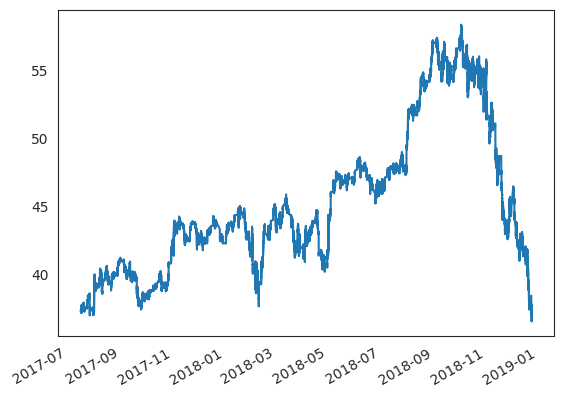

In [3]:
# Read the unscaled indicators dataframe

df_inds = pd.read_csv(params.indunsc_csv, index_col=0, parse_dates=True) # indunsc_test_csv
df_inds = df_inds[(df_inds.index >= '2017-07-15') & (df_inds.index < '2018-12-25')] #########################

df_inds.close.plot()
df_inds

In [4]:
# importlib.reload(params) #####
# importlib.reload(strategies) #####

first_day = df_inds.index.normalize().min()
start_ask = df_inds.loc[df_inds.index.normalize() == first_day, "ask"].iloc[0]
strategies.reset_globals(start_ask)  # reset globals and initialize buy&hold with canonical first-day ask

sim_results = {}
groups = df_inds.groupby(df_inds.index.normalize())
total_days = df_inds.index.normalize().nunique()

col_signal = params.col_signal_tick
sign_thresh = params.sign_thresh_tick
sess_start = params.sess_premark

for day, df_day_sim in tqdm(groups, desc="Generate+Simulate", total=total_days):
    
    df_actions = strategies.generate_actions_alpaca(
        df              = df_day_sim,
        col_signal      = col_signal,
        sign_thresh     = sign_thresh,
        col_atr         = params.col_atr_tick,
        col_adx         = params.col_adx_tick,
        col_vol_spike   = params.col_vol_spike_tick,
        col_rsi         = params.col_rsi_tick,
        col_vwap        = params.col_vwap_tick,
        reset_peak      = params.reset_peak_tick,
        rsi_min_thresh  = params.rsi_min_thresh_tick,
        rsi_max_thresh  = params.rsi_max_thresh_tick,
        atr_mult        = params.atr_mult_tick,
        vwap_atr_mult   = params.vwap_atr_mult_tick,
        vol_thresh      = params.vol_thresh_tick,
        adx_thresh      = params.adx_thresh_tick,
        trailstop_pct   = params.trailstop_pct_tick,
        sess_start      = sess_start
    )
    
    sim_results.update(
        strategies.simulate_trading(
            day         = day,
            df          = df_actions,
            buy_factor  = params.buy_factor_tick,
            sell_factor = params.sell_factor_tick,
            sess_start  = sess_start
        )
    )

print("Loop finished. Days simulated:", len(sim_results))


Generate+Simulate:   0%|          | 0/364 [00:00<?, ?it/s]

Loop finished. Days simulated: 364


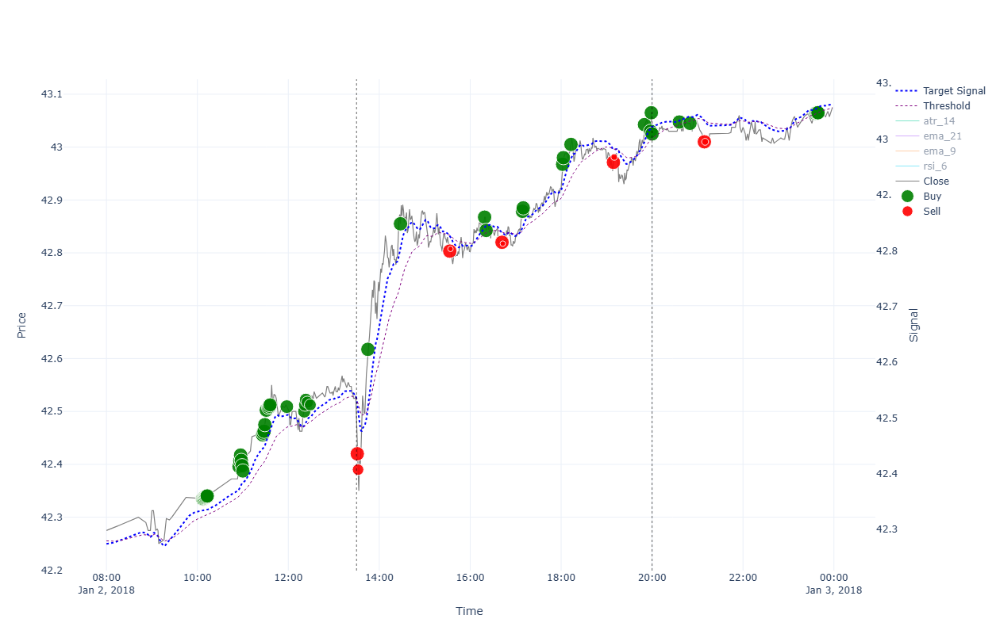


                                                  ******* Performance for 2018-01-02 *******

INTRADAY:
  shares(2105); [ask_buy=42.493, fee_buy=0.004, pos_amnt_buy=89457.237]; [bid_sell=43.016, fee_sell=0.015, pos_amnt_sell=90517.959]; leftover=9.34; PNL=1060.722
TRADES:
  Tr[1]: Time(10:07)Ask(42.343)Bid(42.327)Act(Buy)Shrs(89)Pos(89); CashTr(-3768.925)=Cost(-3768.569)-Fee(-0.356); P&L(92414.721)=CashTot(88647.66)+PosAmt(3767.061)
  Tr[2]: Time(10:08)Ask(42.343)Bid(42.327)Act(Buy)Shrs(86)Pos(175); CashTr(-3641.883)=Cost(-3641.539)-Fee(-0.344); P&L(92412.919)=CashTot(85005.777)+PosAmt(7407.142)
  Tr[3]: Time(10:09)Ask(42.345)Bid(42.328)Act(Buy)Shrs(82)Pos(257); CashTr(-3472.578)=Cost(-3472.25)-Fee(-0.328); P&L(92411.384)=CashTot(81533.199)+PosAmt(10878.185)
  Tr[4]: Time(10:10)Ask(42.346)Bid(42.329)Act(Buy)Shrs(79)Pos(336); CashTr(-3345.615)=Cost(-3345.299)-Fee(-0.316); P&L(92409.996)=CashTot(78187.584)+PosAmt(14222.412)
  Tr[5]: Time(10:11)Ask(42.347)Bid(42.33)Act(Buy)Shrs(76)Pos(41

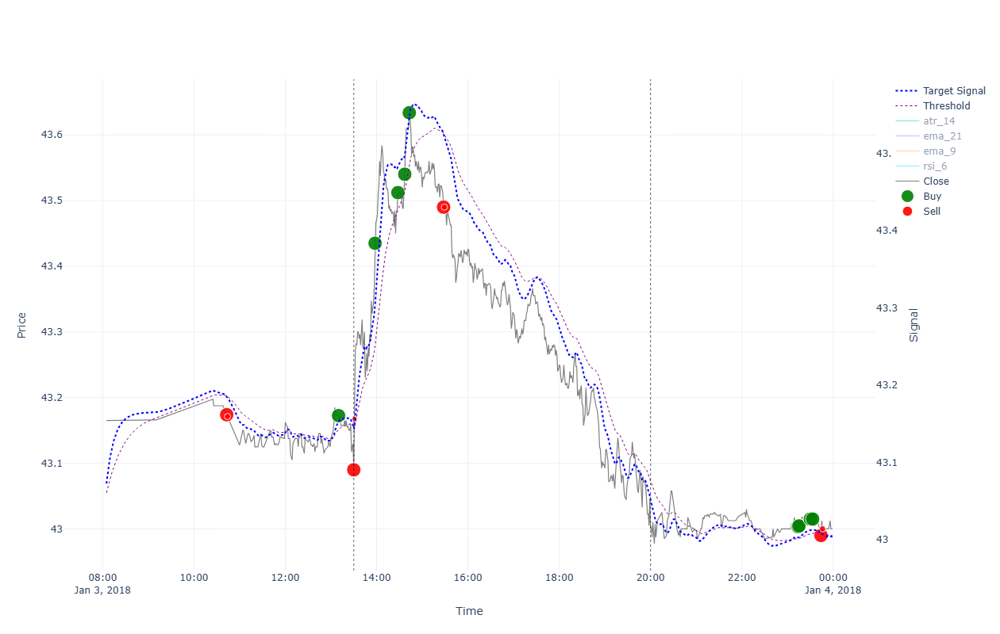


                                                  ******* Performance for 2018-01-03 *******

INTRADAY:
  shares(2100); [ask_buy=43.099, fee_buy=0.004, pos_amnt_buy=90515.512]; [bid_sell=42.991, fee_sell=0.015, pos_amnt_sell=90250.454]; leftover=11.787; PNL=-265.059
TRADES:
  Tr[1]: Time(10:43)Ask(43.183)Bid(43.165)Act(Sell)Shrs(324)Pos(6); CashTr(13980.672)=Cost(13985.531)-Fee(-4.859); P&L(92355.973)=CashTot(92096.982)+PosAmt(258.991)
  Tr[2]: Time(10:44)Ask(43.18)Bid(43.162)Act(Sell)Shrs(6)Pos(0); CashTr(258.885)=Cost(258.975)-Fee(-0.09); P&L(92355.867)=CashTot(92355.867)+PosAmt(0.0)
  Tr[3]: Time(13:10)Ask(43.181)Bid(43.164)Act(Buy)Shrs(88)Pos(88); CashTr(-3800.291)=Cost(-3799.939)-Fee(-0.352); P&L(92353.997)=CashTot(88555.576)+PosAmt(3798.421)
  Tr[4]: Time(13:30)Ask(43.099)Bid(43.081)Act(Sell)Shrs(87)Pos(1); CashTr(3746.775)=Cost(3748.08)-Fee(-1.305); P&L(92345.433)=CashTot(92302.351)+PosAmt(43.081)
  Tr[5]: Time(13:31)Ask(43.176)Bid(43.159)Act(Sell)Shrs(1)Pos(0); CashTr(43.144)=

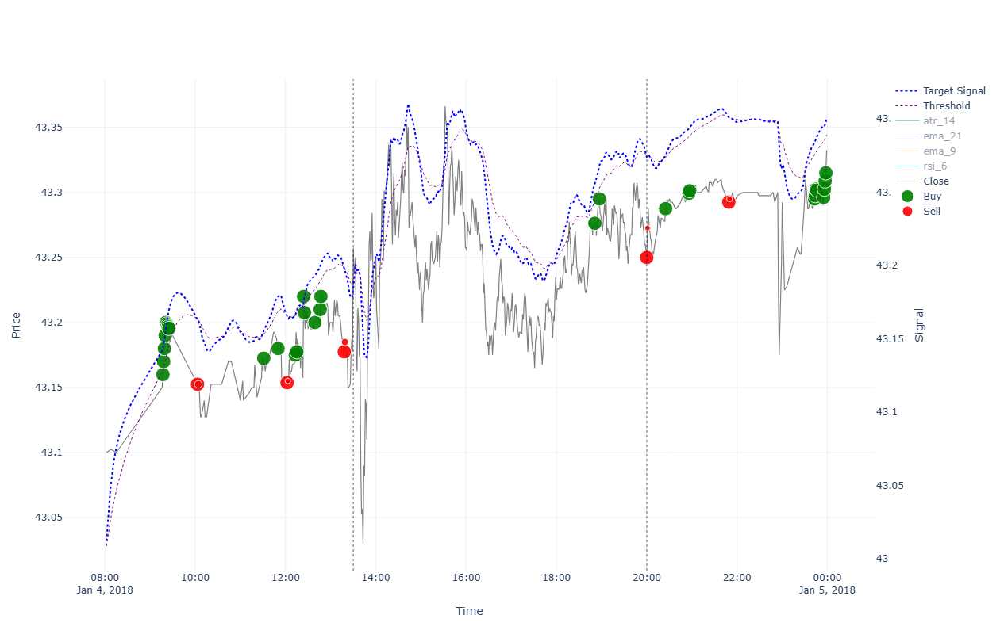


                                                  ******* Performance for 2018-01-04 *******

INTRADAY:
  shares(2086); [ask_buy=43.266, fee_buy=0.004, pos_amnt_buy=90261.533]; [bid_sell=43.241, fee_sell=0.015, pos_amnt_sell=90170.168]; leftover=0.708; PNL=-91.365
TRADES:
  Tr[1]: Time(09:17)Ask(43.169)Bid(43.151)Act(Buy)Shrs(88)Pos(88); CashTr(-3799.191)=Cost(-3798.839)-Fee(-0.352); P&L(92301.101)=CashTot(88503.78)+PosAmt(3797.321)
  Tr[2]: Time(09:18)Ask(43.179)Bid(43.161)Act(Buy)Shrs(84)Pos(172); CashTr(-3627.341)=Cost(-3627.005)-Fee(-0.336); P&L(92300.194)=CashTot(84876.439)+PosAmt(7423.755)
  Tr[3]: Time(09:19)Ask(43.189)Bid(43.171)Act(Buy)Shrs(81)Pos(253); CashTr(-3498.604)=Cost(-3498.28)-Fee(-0.324); P&L(92300.189)=CashTot(81377.835)+PosAmt(10922.354)
  Tr[4]: Time(09:20)Ask(43.199)Bid(43.181)Act(Buy)Shrs(78)Pos(331); CashTr(-3369.806)=Cost(-3369.494)-Fee(-0.312); P&L(92301.057)=CashTot(78008.029)+PosAmt(14293.029)
  Tr[5]: Time(09:21)Ask(43.209)Bid(43.191)Act(Buy)Shrs(74)Pos(4

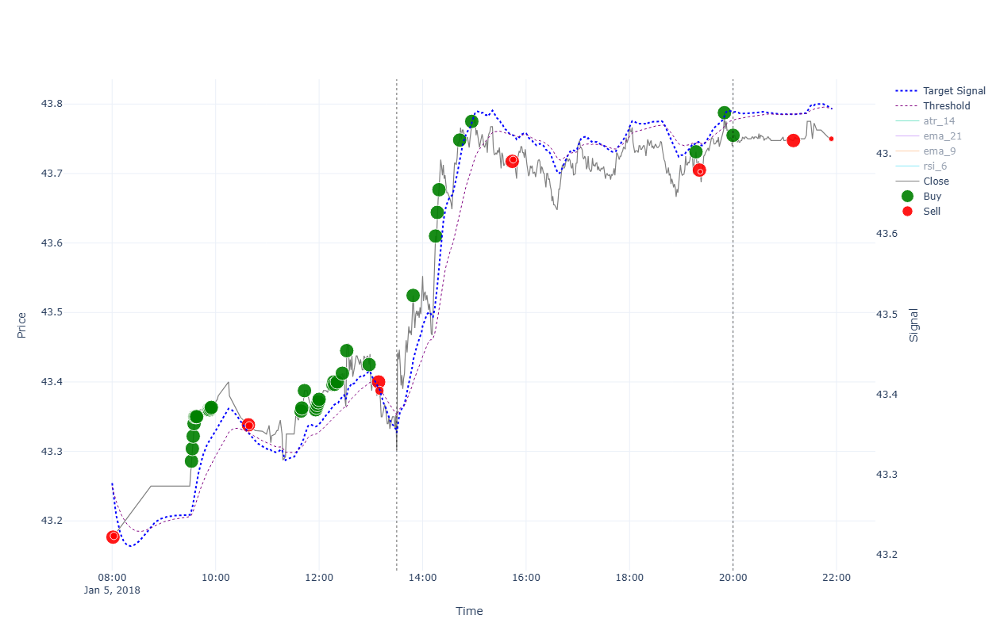


                                                  ******* Performance for 2018-01-05 *******

INTRADAY:
  shares(2081); [ask_buy=43.31, fee_buy=0.004, pos_amnt_buy=90136.746]; [bid_sell=43.746, fee_sell=0.015, pos_amnt_sell=91004.709]; leftover=34.13; PNL=867.963
TRADES:
  Tr[1]: Time(08:01)Ask(43.185)Bid(43.168)Act(Sell)Shrs(595)Pos(11); CashTr(25676.061)=Cost(25684.984)-Fee(-8.924); P&L(92093.951)=CashTot(91619.103)+PosAmt(474.848)
  Tr[2]: Time(08:02)Ask(43.187)Bid(43.17)Act(Sell)Shrs(11)Pos(0); CashTr(474.702)=Cost(474.867)-Fee(-0.165); P&L(92093.805)=CashTot(92093.805)+PosAmt(0.0)
  Tr[3]: Time(09:32)Ask(43.295)Bid(43.277)Act(Buy)Shrs(87)Pos(87); CashTr(-3766.983)=Cost(-3766.635)-Fee(-0.348); P&L(92091.95)=CashTot(88326.821)+PosAmt(3765.129)
  Tr[4]: Time(09:33)Ask(43.313)Bid(43.295)Act(Buy)Shrs(83)Pos(170); CashTr(-3595.283)=Cost(-3594.951)-Fee(-0.332); P&L(92091.745)=CashTot(84731.538)+PosAmt(7360.207)
  Tr[5]: Time(09:34)Ask(43.331)Bid(43.313)Act(Buy)Shrs(80)Pos(250); CashTr(-

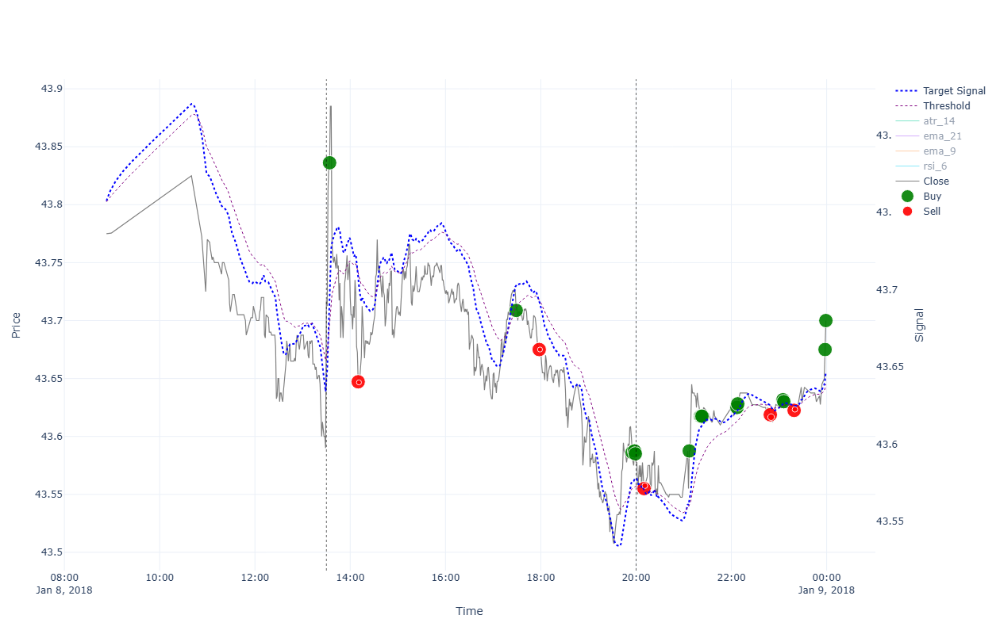


                                                  ******* Performance for 2018-01-08 *******

INTRADAY:
  shares(2081); [ask_buy=43.726, fee_buy=0.004, pos_amnt_buy=91002.65]; [bid_sell=43.569, fee_sell=0.015, pos_amnt_sell=90635.392]; leftover=36.188; PNL=-367.258
TRADES:
  Tr[1]: Time(13:34)Ask(43.845)Bid(43.827)Act(Buy)Shrs(86)Pos(86); CashTr(-3771.01)=Cost(-3770.666)-Fee(-0.344); P&L(92038.663)=CashTot(88269.506)+PosAmt(3769.156)
  Tr[2]: Time(14:10)Ask(43.656)Bid(43.638)Act(Sell)Shrs(85)Pos(1); CashTr(3707.993)=Cost(3709.268)-Fee(-1.276); P&L(92021.137)=CashTot(91977.499)+PosAmt(43.638)
  Tr[3]: Time(14:11)Ask(43.655)Bid(43.638)Act(Sell)Shrs(1)Pos(0); CashTr(43.623)=Cost(43.638)-Fee(-0.015); P&L(92021.122)=CashTot(92021.122)+PosAmt(0.0)
  Tr[4]: Time(17:29)Ask(43.718)Bid(43.7)Act(Buy)Shrs(86)Pos(86); CashTr(-3760.049)=Cost(-3759.705)-Fee(-0.344); P&L(92019.273)=CashTot(88261.073)+PosAmt(3758.2)
  Tr[5]: Time(17:58)Ask(43.684)Bid(43.666)Act(Sell)Shrs(85)Pos(1); CashTr(3710.358)=Co

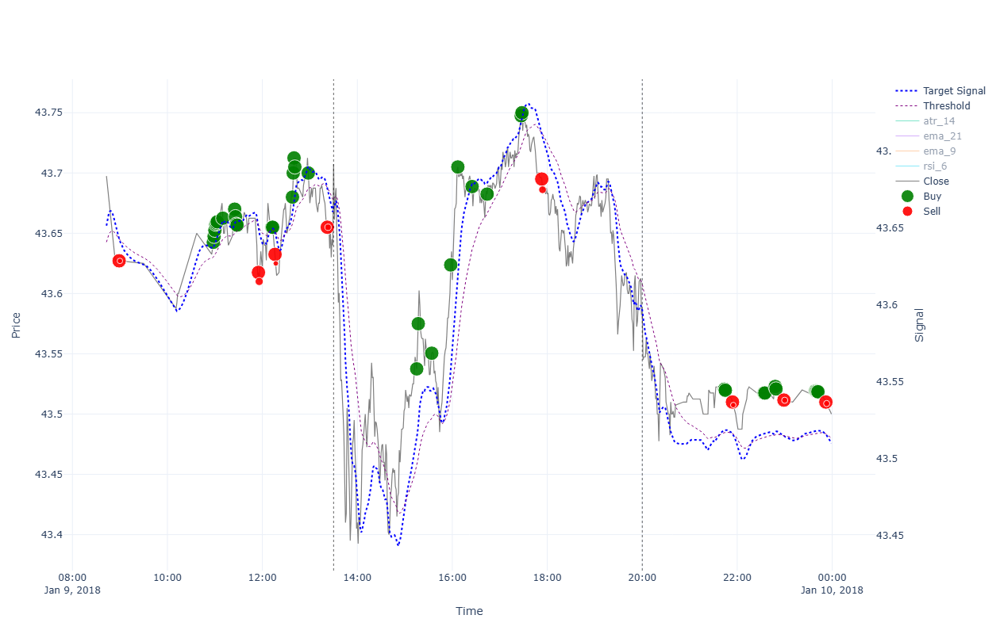


                                                  ******* Performance for 2018-01-09 *******

INTRADAY:
  shares(2073); [ask_buy=43.716, fee_buy=0.004, pos_amnt_buy=90632.078]; [bid_sell=43.574, fee_sell=0.015, pos_amnt_sell=90297.326]; leftover=39.502; PNL=-334.752
TRADES:
  Tr[1]: Time(08:59)Ask(43.636)Bid(43.618)Act(Sell)Shrs(166)Pos(3); CashTr(7238.168)=Cost(7240.659)-Fee(-2.491); P&L(91959.256)=CashTot(91828.401)+PosAmt(130.855)
  Tr[2]: Time(09:00)Ask(43.636)Bid(43.618)Act(Sell)Shrs(3)Pos(0); CashTr(130.81)=Cost(130.855)-Fee(-0.045); P&L(91959.211)=CashTot(91959.211)+PosAmt(0.0)
  Tr[3]: Time(10:58)Ask(43.651)Bid(43.634)Act(Buy)Shrs(86)Pos(86); CashTr(-3754.349)=Cost(-3754.005)-Fee(-0.344); P&L(91957.366)=CashTot(88204.861)+PosAmt(3752.505)
  Tr[4]: Time(10:59)Ask(43.656)Bid(43.639)Act(Buy)Shrs(83)Pos(169); CashTr(-3623.799)=Cost(-3623.467)-Fee(-0.332); P&L(91956.016)=CashTot(84581.063)+PosAmt(7374.953)
  Tr[5]: Time(11:00)Ask(43.661)Bid(43.644)Act(Buy)Shrs(79)Pos(248); CashTr(-

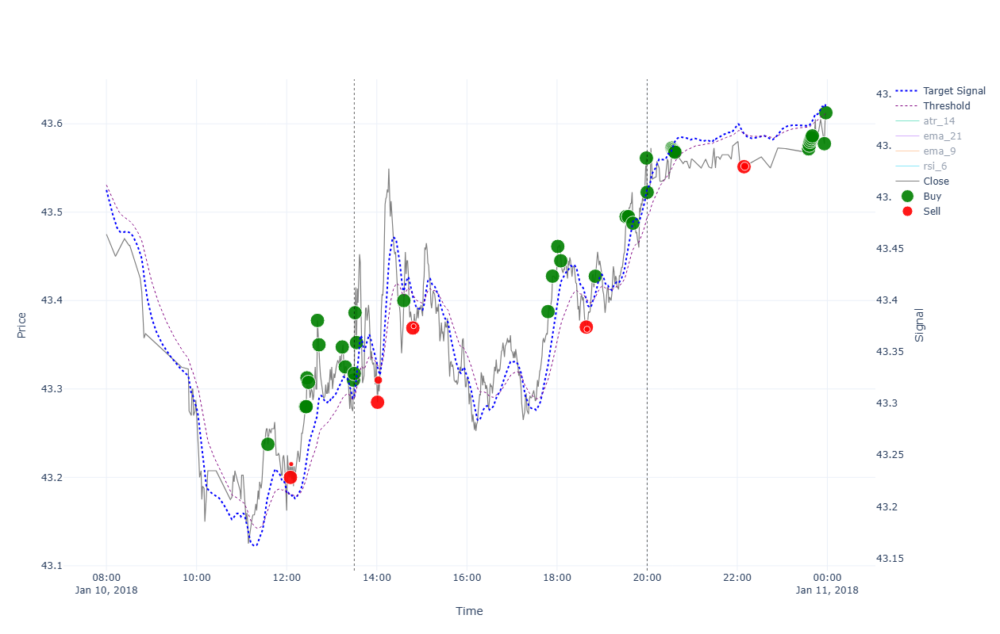


                                                  ******* Performance for 2018-01-10 *******

INTRADAY:
  shares(2084); [ask_buy=43.326, fee_buy=0.004, pos_amnt_buy=90300.085]; [bid_sell=43.514, fee_sell=0.015, pos_amnt_sell=90651.488]; leftover=36.744; PNL=351.403
TRADES:
  Tr[1]: Time(11:35)Ask(43.246)Bid(43.229)Act(Buy)Shrs(87)Pos(87); CashTr(-3762.763)=Cost(-3762.415)-Fee(-0.348); P&L(91829.984)=CashTot(88069.074)+PosAmt(3760.91)
  Tr[2]: Time(12:05)Ask(43.209)Bid(43.191)Act(Sell)Shrs(86)Pos(1); CashTr(3713.166)=Cost(3714.456)-Fee(-1.29); P&L(91825.432)=CashTot(91782.24)+PosAmt(43.191)
  Tr[3]: Time(12:06)Ask(43.224)Bid(43.206)Act(Sell)Shrs(1)Pos(0); CashTr(43.191)=Cost(43.206)-Fee(-0.015); P&L(91825.432)=CashTot(91825.432)+PosAmt(0.0)
  Tr[4]: Time(12:25)Ask(43.289)Bid(43.271)Act(Buy)Shrs(87)Pos(87); CashTr(-3766.461)=Cost(-3766.113)-Fee(-0.348); P&L(91823.579)=CashTot(88058.971)+PosAmt(3764.607)
  Tr[5]: Time(12:26)Ask(43.289)Bid(43.271)Act(Buy)Shrs(84)Pos(171); CashTr(-3636.583

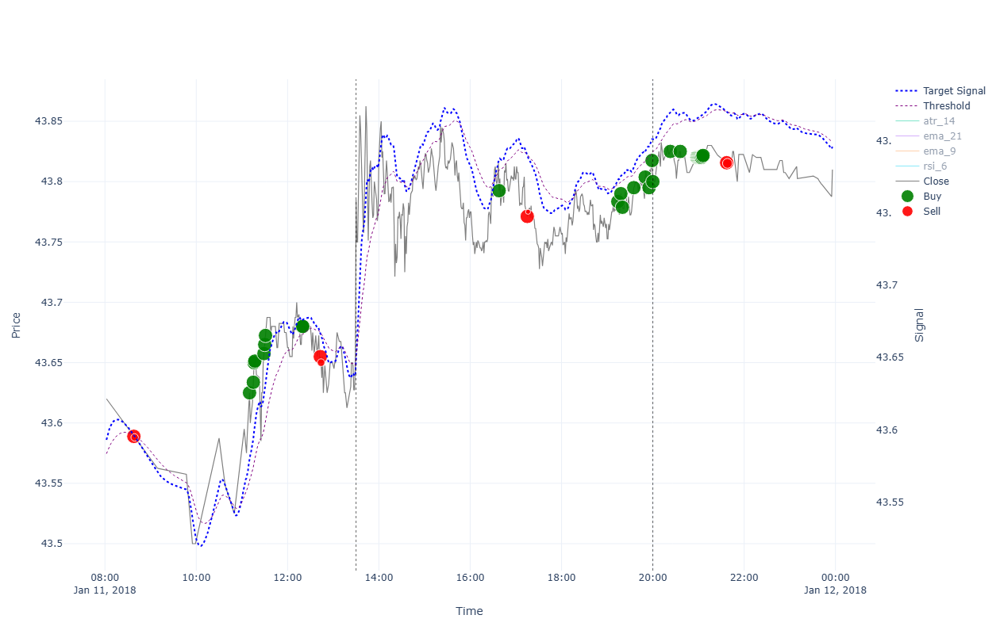


                                                  ******* Performance for 2018-01-11 *******

INTRADAY:
  shares(2070); [ask_buy=43.794, fee_buy=0.004, pos_amnt_buy=90661.342]; [bid_sell=43.791, fee_sell=0.015, pos_amnt_sell=90616.813]; leftover=26.889; PNL=-44.529
TRADES:
  Tr[1]: Time(08:38)Ask(43.598)Bid(43.58)Act(Sell)Shrs(586)Pos(11); CashTr(25529.194)=Cost(25537.988)-Fee(-8.794); P&L(91697.511)=CashTot(91218.129)+PosAmt(479.382)
  Tr[2]: Time(08:39)Ask(43.597)Bid(43.579)Act(Sell)Shrs(11)Pos(0); CashTr(479.207)=Cost(479.373)-Fee(-0.165); P&L(91697.337)=CashTot(91697.337)+PosAmt(0.0)
  Tr[3]: Time(11:10)Ask(43.634)Bid(43.616)Act(Buy)Shrs(86)Pos(86); CashTr(-3752.844)=Cost(-3752.5)-Fee(-0.344); P&L(91695.492)=CashTot(87944.492)+PosAmt(3751.0)
  Tr[4]: Time(11:15)Ask(43.642)Bid(43.625)Act(Buy)Shrs(83)Pos(169); CashTr(-3622.657)=Cost(-3622.325)-Fee(-0.332); P&L(91694.464)=CashTot(84321.835)+PosAmt(7372.629)
  Tr[5]: Time(11:16)Ask(43.659)Bid(43.641)Act(Buy)Shrs(80)Pos(249); CashTr(-3

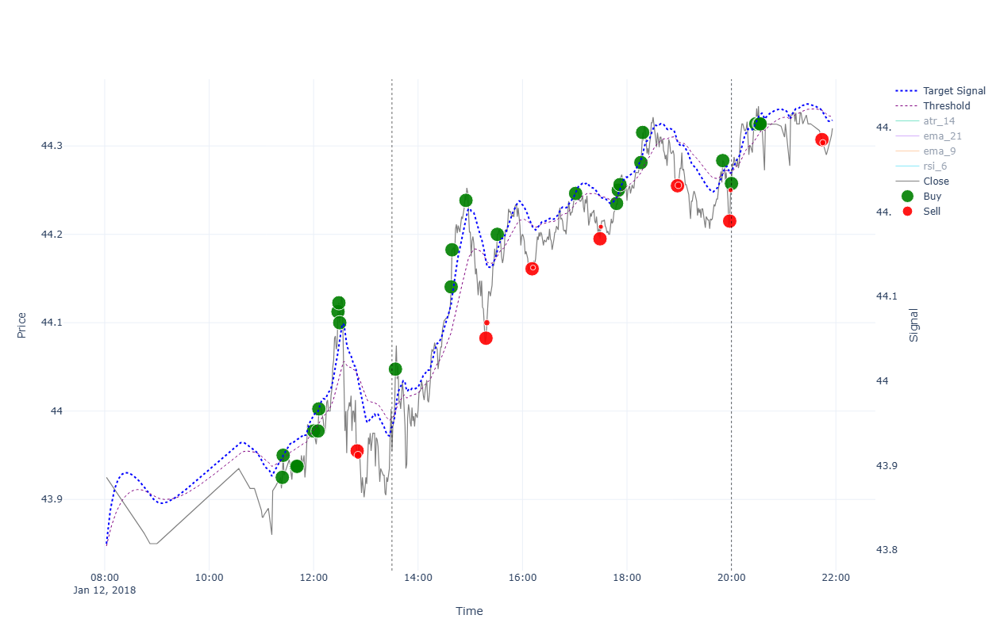


                                                  ******* Performance for 2018-01-12 *******

INTRADAY:
  shares(2061); [ask_buy=43.964, fee_buy=0.004, pos_amnt_buy=90617.842]; [bid_sell=44.249, fee_sell=0.015, pos_amnt_sell=91165.507]; leftover=25.86; PNL=547.665
TRADES:
  Tr[1]: Time(11:24)Ask(43.934)Bid(43.916)Act(Buy)Shrs(85)Pos(85); CashTr(-3734.711)=Cost(-3734.371)-Fee(-0.34); P&L(91633.766)=CashTot(87900.887)+PosAmt(3732.879)
  Tr[2]: Time(11:25)Ask(43.959)Bid(43.941)Act(Buy)Shrs(82)Pos(167); CashTr(-3604.95)=Cost(-3604.622)-Fee(-0.328); P&L(91634.117)=CashTot(84295.937)+PosAmt(7338.18)
  Tr[3]: Time(11:40)Ask(43.946)Bid(43.929)Act(Buy)Shrs(79)Pos(246); CashTr(-3472.072)=Cost(-3471.756)-Fee(-0.316); P&L(91630.332)=CashTot(80823.865)+PosAmt(10806.466)
  Tr[4]: Time(11:41)Ask(43.946)Bid(43.929)Act(Buy)Shrs(75)Pos(321); CashTr(-3296.271)=Cost(-3295.971)-Fee(-0.3); P&L(91628.715)=CashTot(77527.595)+PosAmt(14101.121)
  Tr[5]: Time(12:00)Ask(43.986)Bid(43.969)Act(Buy)Shrs(73)Pos(394)

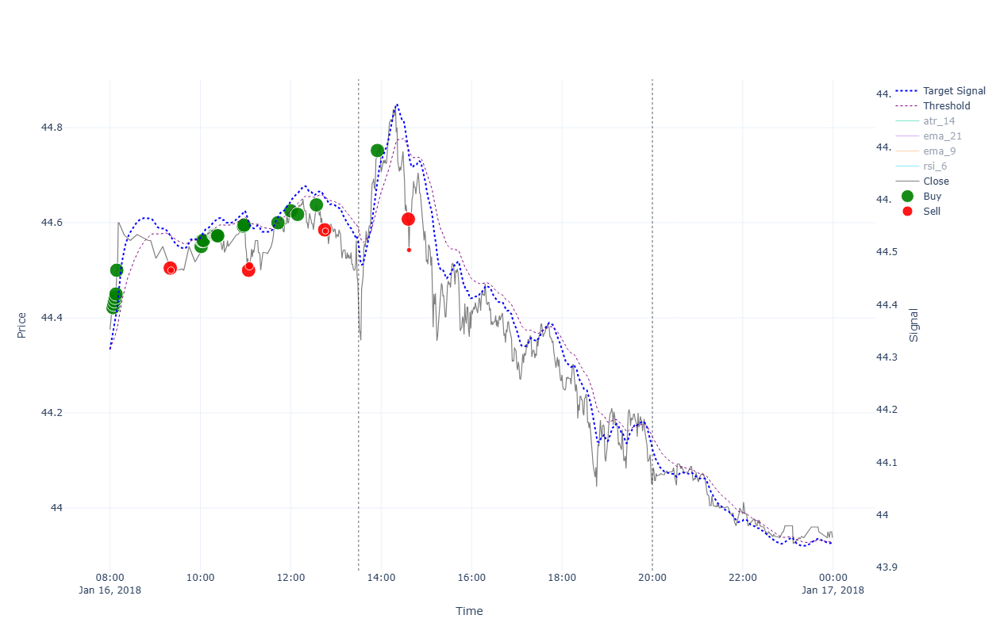


                                                  ******* Performance for 2018-01-16 *******

INTRADAY:
  shares(2051); [ask_buy=44.444, fee_buy=0.004, pos_amnt_buy=91162.592]; [bid_sell=44.044, fee_sell=0.015, pos_amnt_sell=90302.828]; leftover=28.775; PNL=-859.764
TRADES:
  Tr[1]: Time(08:04)Ask(44.43)Bid(44.413)Act(Buy)Shrs(85)Pos(85); CashTr(-3776.917)=Cost(-3776.577)-Fee(-0.34); P&L(91491.29)=CashTot(87716.224)+PosAmt(3775.066)
  Tr[2]: Time(08:05)Ask(44.437)Bid(44.42)Act(Buy)Shrs(81)Pos(166); CashTr(-3599.758)=Cost(-3599.434)-Fee(-0.324); P&L(91490.133)=CashTot(84116.465)+PosAmt(7373.667)
  Tr[3]: Time(08:06)Ask(44.445)Bid(44.427)Act(Buy)Shrs(78)Pos(244); CashTr(-3466.991)=Cost(-3466.679)-Fee(-0.312); P&L(91489.618)=CashTot(80649.474)+PosAmt(10840.144)
  Tr[4]: Time(08:07)Ask(44.452)Bid(44.434)Act(Buy)Shrs(75)Pos(319); CashTr(-3334.182)=Cost(-3333.882)-Fee(-0.3); P&L(91489.726)=CashTot(77315.293)+PosAmt(14174.433)
  Tr[5]: Time(08:08)Ask(44.459)Bid(44.441)Act(Buy)Shrs(72)Pos(391

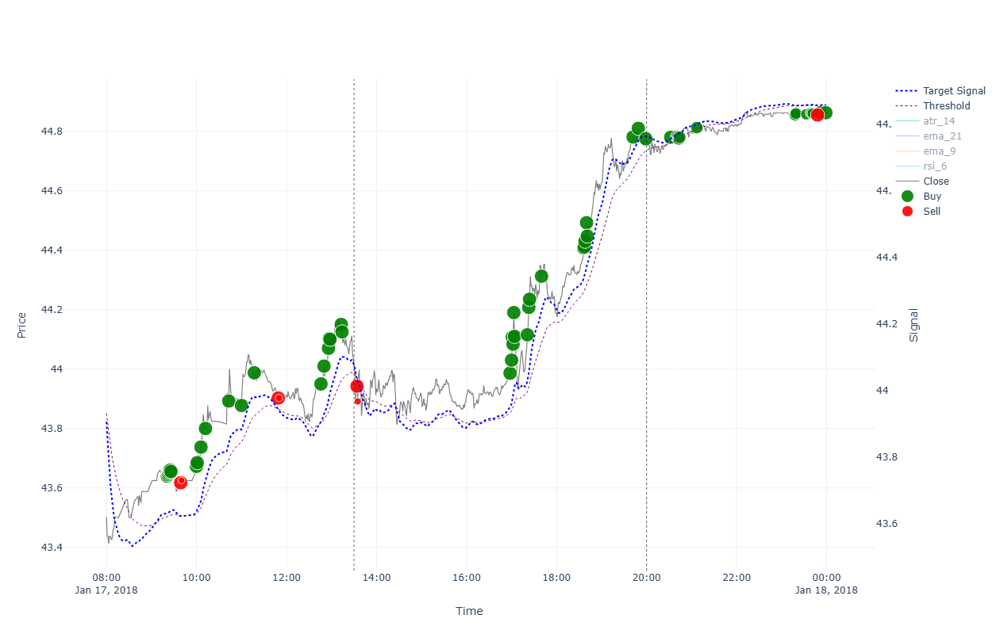


                                                  ******* Performance for 2018-01-17 *******

INTRADAY:
  shares(2051); [ask_buy=44.018, fee_buy=0.004, pos_amnt_buy=90289.071]; [bid_sell=44.754, fee_sell=0.015, pos_amnt_sell=91758.697]; leftover=42.532; PNL=1469.626
TRADES:
  Tr[1]: Time(09:21)Ask(43.649)Bid(43.631)Act(Buy)Shrs(86)Pos(86); CashTr(-3754.134)=Cost(-3753.79)-Fee(-0.344); P&L(91376.851)=CashTot(87624.561)+PosAmt(3752.29)
  Tr[2]: Time(09:22)Ask(43.654)Bid(43.636)Act(Buy)Shrs(82)Pos(168); CashTr(-3579.933)=Cost(-3579.605)-Fee(-0.328); P&L(91375.522)=CashTot(84044.627)+PosAmt(7330.894)
  Tr[3]: Time(09:23)Ask(43.659)Bid(43.641)Act(Buy)Shrs(79)Pos(247); CashTr(-3449.355)=Cost(-3449.039)-Fee(-0.316); P&L(91374.667)=CashTot(80595.272)+PosAmt(10779.395)
  Tr[4]: Time(09:24)Ask(43.664)Bid(43.646)Act(Buy)Shrs(76)Pos(323); CashTr(-3318.747)=Cost(-3318.443)-Fee(-0.304); P&L(91374.272)=CashTot(77276.525)+PosAmt(14097.747)
  Tr[5]: Time(09:25)Ask(43.669)Bid(43.651)Act(Buy)Shrs(73)Pos

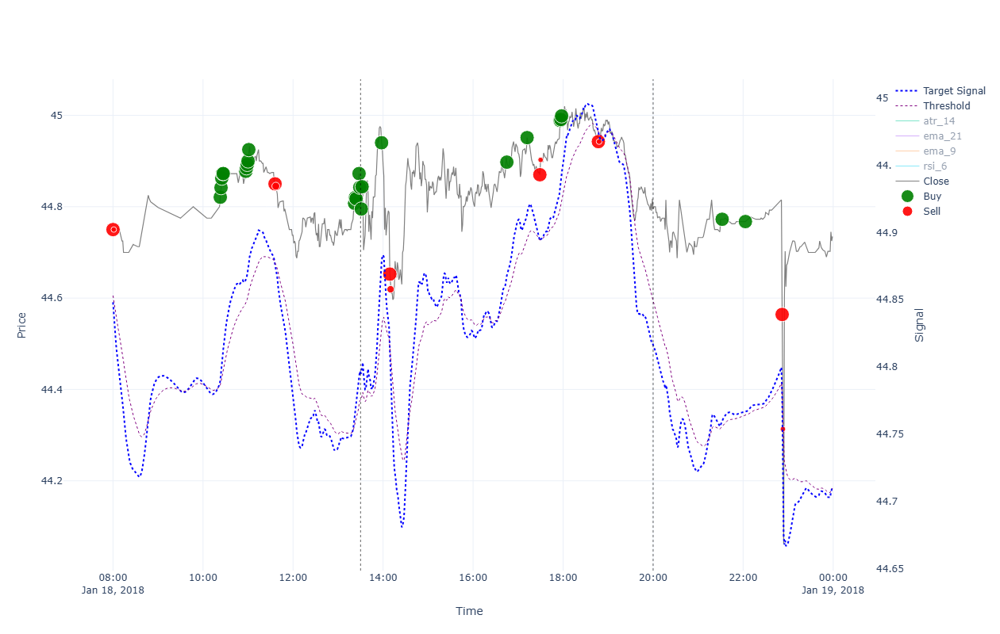


                                                  ******* Performance for 2018-01-18 *******

INTRADAY:
  shares(2049); [ask_buy=44.791, fee_buy=0.004, pos_amnt_buy=91785.877]; [bid_sell=44.786, fee_sell=0.015, pos_amnt_sell=91735.811]; leftover=15.351; PNL=-50.066
TRADES:
  Tr[1]: Time(08:00)Ask(44.759)Bid(44.741)Act(Sell)Shrs(186)Pos(3); CashTr(8319.039)=Cost(8321.835)-Fee(-2.796); P&L(91866.649)=CashTot(91732.425)+PosAmt(134.223)
  Tr[2]: Time(08:01)Ask(44.759)Bid(44.741)Act(Sell)Shrs(3)Pos(0); CashTr(134.178)=Cost(134.223)-Fee(-0.045); P&L(91866.603)=CashTot(91866.603)+PosAmt(0.0)
  Tr[3]: Time(10:23)Ask(44.83)Bid(44.812)Act(Buy)Shrs(84)Pos(84); CashTr(-3766.038)=Cost(-3765.702)-Fee(-0.336); P&L(91864.762)=CashTot(88100.565)+PosAmt(3764.198)
  Tr[4]: Time(10:24)Ask(44.851)Bid(44.833)Act(Buy)Shrs(80)Pos(164); CashTr(-3588.371)=Cost(-3588.051)-Fee(-0.32); P&L(91864.757)=CashTot(84512.194)+PosAmt(7352.563)
  Tr[5]: Time(10:25)Ask(44.871)Bid(44.854)Act(Buy)Shrs(77)Pos(241); CashTr(-34

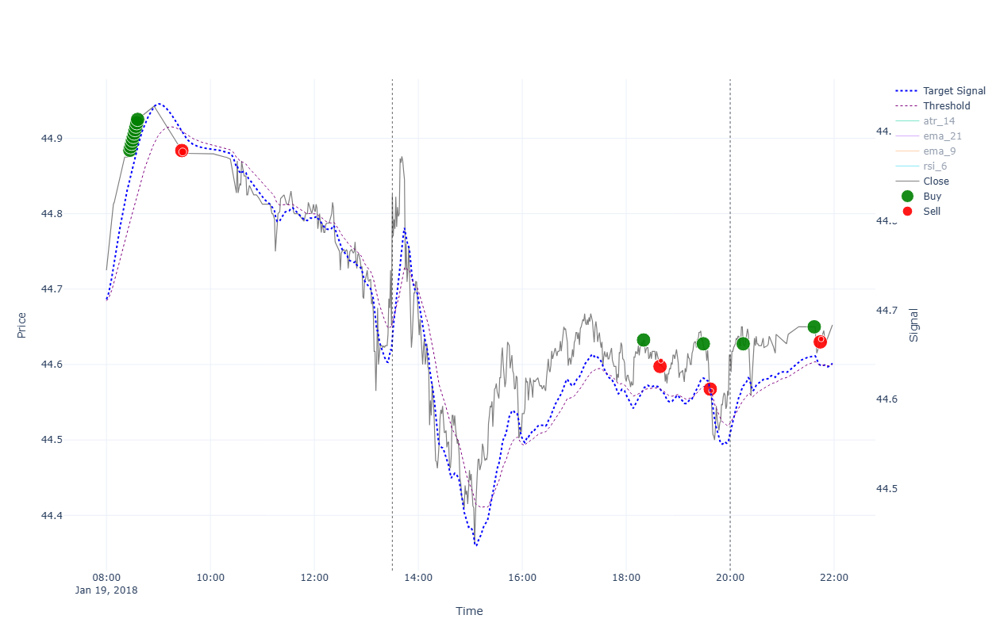


                                                  ******* Performance for 2018-01-19 *******

INTRADAY:
  shares(2046); [ask_buy=44.834, fee_buy=0.004, pos_amnt_buy=91738.497]; [bid_sell=44.604, fee_sell=0.015, pos_amnt_sell=91228.162]; leftover=12.665; PNL=-510.335
TRADES:
  Tr[1]: Time(08:27)Ask(44.893)Bid(44.875)Act(Buy)Shrs(85)Pos(85); CashTr(-3816.251)=Cost(-3815.911)-Fee(-0.34); P&L(91615.526)=CashTot(87801.142)+PosAmt(3814.385)
  Tr[2]: Time(08:28)Ask(44.898)Bid(44.88)Act(Buy)Shrs(82)Pos(167); CashTr(-3681.932)=Cost(-3681.604)-Fee(-0.328); P&L(91614.113)=CashTot(84119.209)+PosAmt(7494.903)
  Tr[3]: Time(08:29)Ask(44.902)Bid(44.884)Act(Buy)Shrs(78)Pos(245); CashTr(-3502.68)=Cost(-3502.368)-Fee(-0.312); P&L(91613.16)=CashTot(80616.529)+PosAmt(10996.631)
  Tr[4]: Time(08:30)Ask(44.907)Bid(44.889)Act(Buy)Shrs(75)Pos(320); CashTr(-3368.303)=Cost(-3368.003)-Fee(-0.3); P&L(91612.627)=CashTot(77248.227)+PosAmt(14364.401)
  Tr[5]: Time(08:31)Ask(44.911)Bid(44.893)Act(Buy)Shrs(72)Pos(392

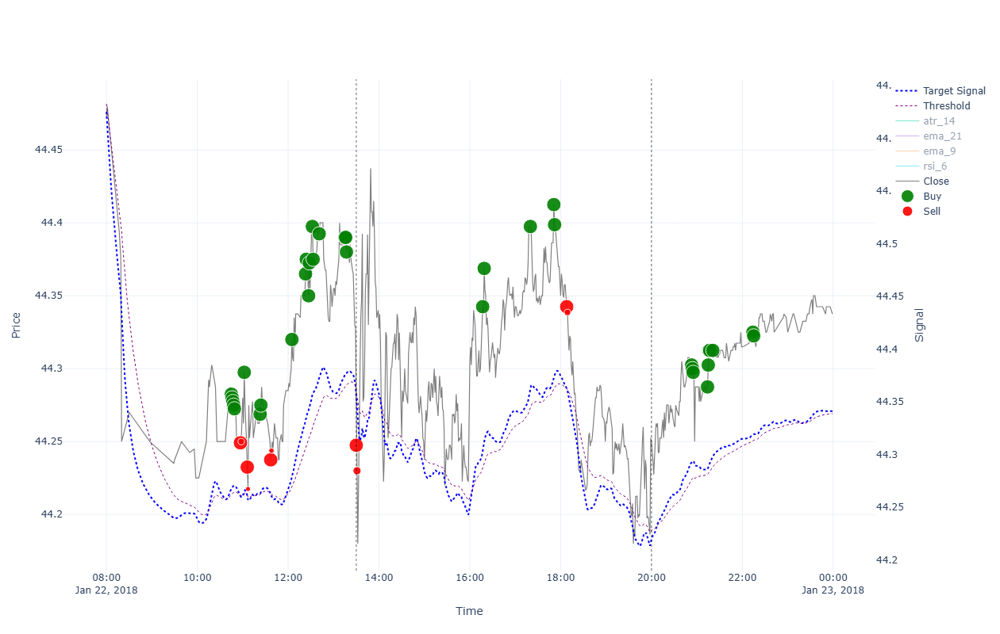


                                                  ******* Performance for 2018-01-22 *******

INTRADAY:
  shares(2061); [ask_buy=44.256, fee_buy=0.004, pos_amnt_buy=91220.581]; [bid_sell=44.241, fee_sell=0.015, pos_amnt_sell=91150.05]; leftover=20.246; PNL=-70.532
TRADES:
  Tr[1]: Time(10:45)Ask(44.291)Bid(44.274)Act(Buy)Shrs(84)Pos(84); CashTr(-3720.809)=Cost(-3720.473)-Fee(-0.336); P&L(91554.046)=CashTot(87835.059)+PosAmt(3718.987)
  Tr[2]: Time(10:46)Ask(44.289)Bid(44.271)Act(Buy)Shrs(81)Pos(165); CashTr(-3587.721)=Cost(-3587.397)-Fee(-0.324); P&L(91552.078)=CashTot(84247.338)+PosAmt(7304.74)
  Tr[3]: Time(10:47)Ask(44.286)Bid(44.269)Act(Buy)Shrs(78)Pos(243); CashTr(-3454.647)=Cost(-3454.335)-Fee(-0.312); P&L(91549.973)=CashTot(80792.691)+PosAmt(10757.282)
  Tr[4]: Time(10:48)Ask(44.284)Bid(44.266)Act(Buy)Shrs(75)Pos(318); CashTr(-3321.589)=Cost(-3321.289)-Fee(-0.3); P&L(91547.738)=CashTot(77471.102)+PosAmt(14076.636)
  Tr[5]: Time(10:49)Ask(44.281)Bid(44.264)Act(Buy)Shrs(72)Pos(39

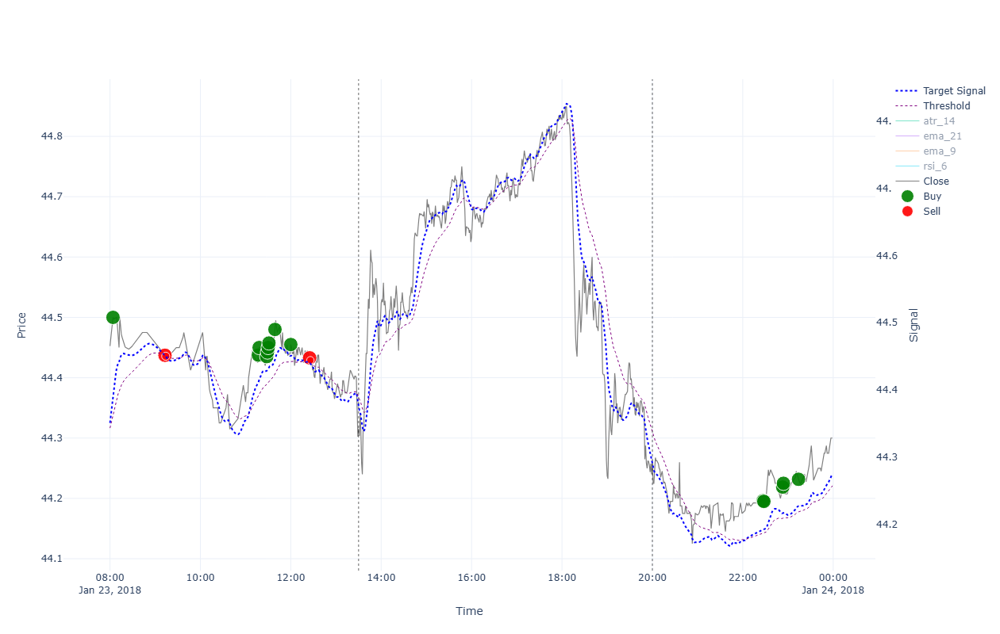


                                                  ******* Performance for 2018-01-23 *******

INTRADAY:
  shares(2056); [ask_buy=44.324, fee_buy=0.004, pos_amnt_buy=91138.111]; [bid_sell=44.251, fee_sell=0.015, pos_amnt_sell=90949.478]; leftover=32.185; PNL=-188.633
TRADES:
  Tr[1]: Time(08:04)Ask(44.509)Bid(44.491)Act(Buy)Shrs(56)Pos(760); CashTr(-2492.722)=Cost(-2492.498)-Fee(-0.224); P&L(91476.903)=CashTot(57663.667)+PosAmt(33813.236)
  Tr[2]: Time(09:13)Ask(44.446)Bid(44.428)Act(Sell)Shrs(746)Pos(14); CashTr(33132.335)=Cost(33143.545)-Fee(-11.21); P&L(91417.999)=CashTot(90796.002)+PosAmt(621.997)
  Tr[3]: Time(09:14)Ask(44.445)Bid(44.427)Act(Sell)Shrs(14)Pos(0); CashTr(621.764)=Cost(621.975)-Fee(-0.21); P&L(91417.767)=CashTot(91417.767)+PosAmt(0.0)
  Tr[4]: Time(11:17)Ask(44.446)Bid(44.429)Act(Buy)Shrs(85)Pos(85); CashTr(-3778.284)=Cost(-3777.944)-Fee(-0.34); P&L(91415.914)=CashTot(87639.483)+PosAmt(3776.431)
  Tr[5]: Time(11:18)Ask(44.459)Bid(44.441)Act(Buy)Shrs(81)Pos(166); Cash

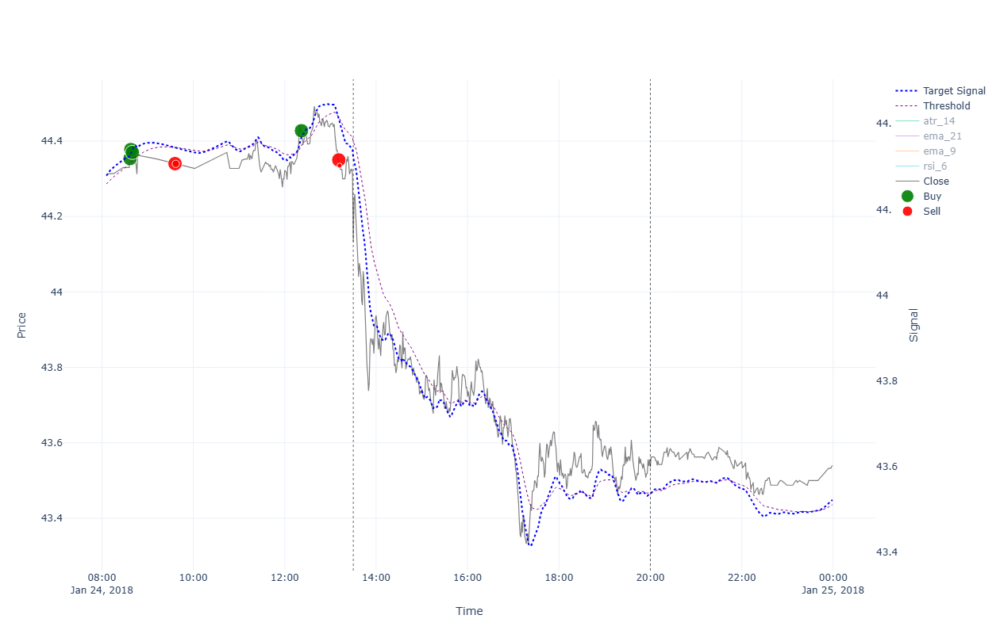


                                                  ******* Performance for 2018-01-24 *******

INTRADAY:
  shares(2060); [ask_buy=44.141, fee_buy=0.004, pos_amnt_buy=90939.37]; [bid_sell=43.526, fee_sell=0.015, pos_amnt_sell=89633.266]; leftover=42.294; PNL=-1306.103
TRADES:
  Tr[1]: Time(08:37)Ask(44.363)Bid(44.345)Act(Buy)Shrs(69)Pos(459); CashTr(-3061.297)=Cost(-3061.021)-Fee(-0.276); P&L(91431.104)=CashTot(71076.806)+PosAmt(20354.298)
  Tr[2]: Time(08:38)Ask(44.386)Bid(44.369)Act(Buy)Shrs(66)Pos(525); CashTr(-2929.765)=Cost(-2929.501)-Fee(-0.264); P&L(91440.57)=CashTot(68147.042)+PosAmt(23293.528)
  Tr[3]: Time(08:40)Ask(44.379)Bid(44.361)Act(Buy)Shrs(63)Pos(588); CashTr(-2796.121)=Cost(-2795.869)-Fee(-0.252); P&L(91435.262)=CashTot(65350.921)+PosAmt(26084.342)
  Tr[4]: Time(09:36)Ask(44.349)Bid(44.331)Act(Sell)Shrs(577)Pos(11); CashTr(25570.512)=Cost(25579.181)-Fee(-8.669); P&L(91409.078)=CashTot(90921.433)+PosAmt(487.645)
  Tr[5]: Time(09:37)Ask(44.349)Bid(44.331)Act(Sell)Shrs(11

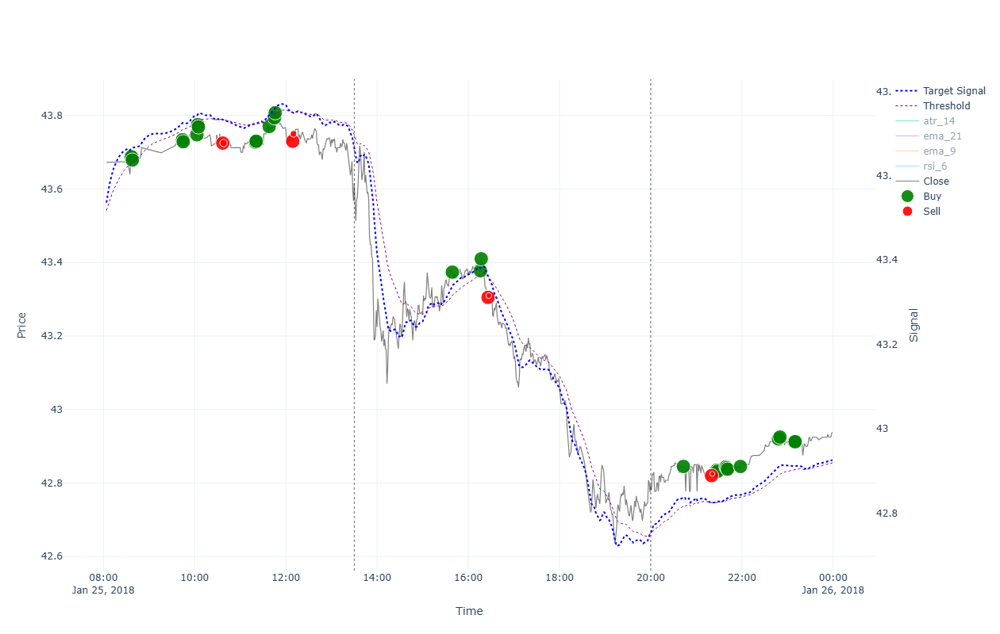


                                                  ******* Performance for 2018-01-25 *******

INTRADAY:
  shares(2055); [ask_buy=43.625, fee_buy=0.004, pos_amnt_buy=89657.544]; [bid_sell=42.786, fee_sell=0.015, pos_amnt_sell=87895.353]; leftover=18.016; PNL=-1762.191
TRADES:
  Tr[1]: Time(08:36)Ask(43.696)Bid(43.679)Act(Buy)Shrs(87)Pos(87); CashTr(-3801.922)=Cost(-3801.574)-Fee(-0.348); P&L(91397.308)=CashTot(87597.257)+PosAmt(3800.051)
  Tr[2]: Time(08:37)Ask(43.696)Bid(43.679)Act(Buy)Shrs(83)Pos(170); CashTr(-3627.121)=Cost(-3626.789)-Fee(-0.332); P&L(91395.523)=CashTot(83970.136)+PosAmt(7425.387)
  Tr[3]: Time(08:38)Ask(43.687)Bid(43.67)Act(Buy)Shrs(80)Pos(250); CashTr(-3495.319)=Cost(-3494.999)-Fee(-0.32); P&L(91392.32)=CashTot(80474.817)+PosAmt(10917.503)
  Tr[4]: Time(09:44)Ask(43.743)Bid(43.725)Act(Buy)Shrs(76)Pos(326); CashTr(-3324.753)=Cost(-3324.449)-Fee(-0.304); P&L(91404.495)=CashTot(77150.064)+PosAmt(14254.432)
  Tr[5]: Time(09:45)Ask(43.737)Bid(43.72)Act(Buy)Shrs(72)Pos(

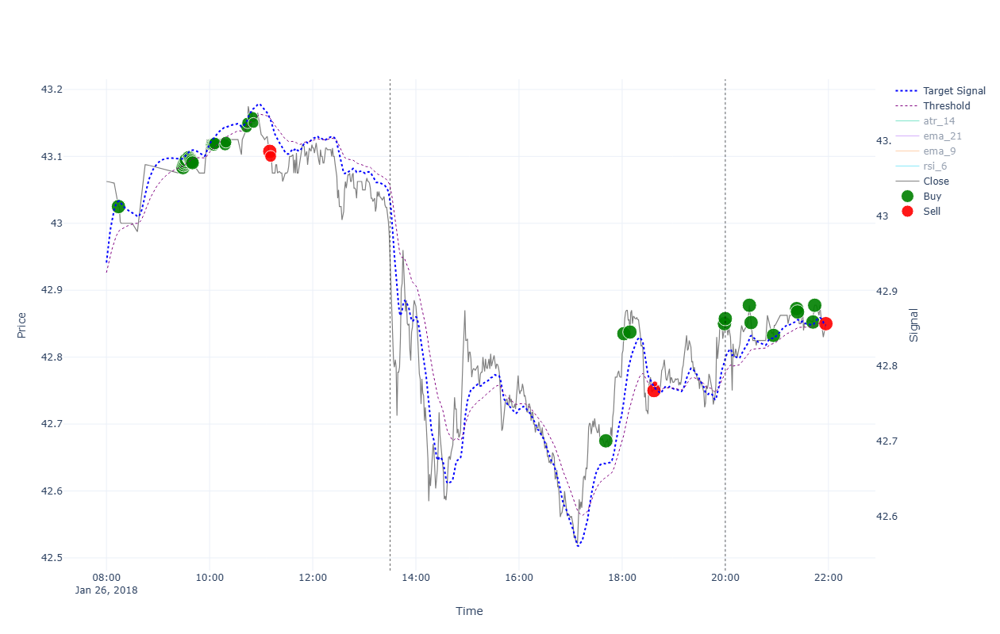


                                                  ******* Performance for 2018-01-26 *******

INTRADAY:
  shares(2046); [ask_buy=42.951, fee_buy=0.004, pos_amnt_buy=87886.135]; [bid_sell=42.849, fee_sell=0.015, pos_amnt_sell=87638.231]; leftover=27.234; PNL=-247.904
TRADES:
  Tr[1]: Time(08:14)Ask(43.034)Bid(43.016)Act(Buy)Shrs(58)Pos(785); CashTr(-2496.181)=Cost(-2495.949)-Fee(-0.232); P&L(91414.806)=CashTot(57646.932)+PosAmt(33767.874)
  Tr[2]: Time(09:29)Ask(43.092)Bid(43.075)Act(Buy)Shrs(55)Pos(840); CashTr(-2370.278)=Cost(-2370.058)-Fee(-0.22); P&L(91459.41)=CashTot(55276.655)+PosAmt(36182.755)
  Tr[3]: Time(09:30)Ask(43.096)Bid(43.079)Act(Buy)Shrs(53)Pos(893); CashTr(-2284.307)=Cost(-2284.095)-Fee(-0.212); P&L(91461.783)=CashTot(52992.348)+PosAmt(38469.435)
  Tr[4]: Time(09:31)Ask(43.099)Bid(43.081)Act(Buy)Shrs(51)Pos(944); CashTr(-2198.234)=Cost(-2198.03)-Fee(-0.204); P&L(91462.932)=CashTot(50794.114)+PosAmt(40668.818)
  Tr[5]: Time(09:32)Ask(43.101)Bid(43.084)Act(Buy)Shrs(48)P

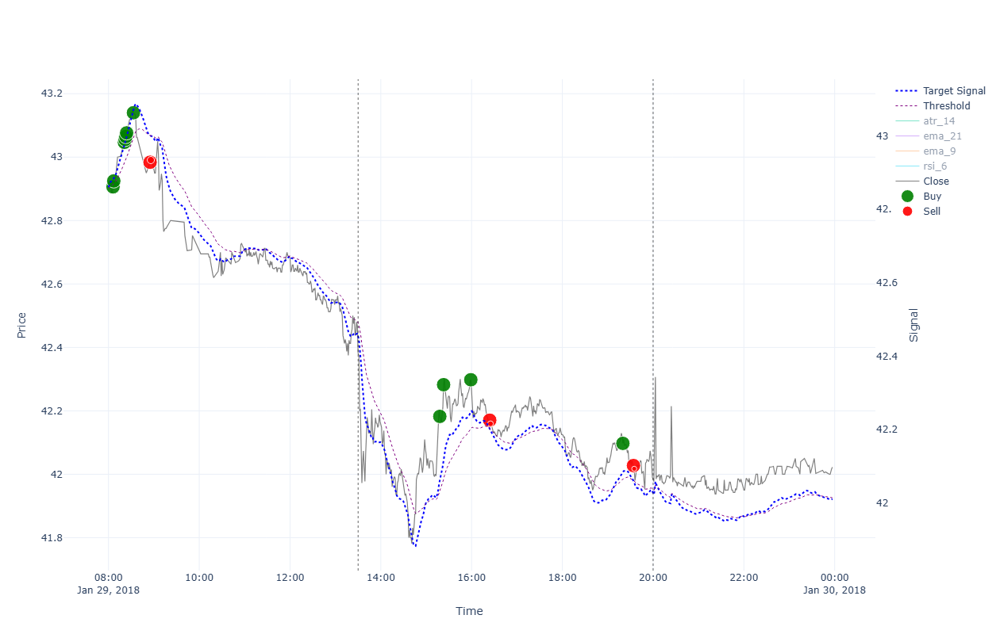


                                                  ******* Performance for 2018-01-29 *******

INTRADAY:
  shares(2067); [ask_buy=42.39, fee_buy=0.004, pos_amnt_buy=87627.83]; [bid_sell=41.977, fee_sell=0.015, pos_amnt_sell=86734.689]; leftover=37.635; PNL=-893.141
TRADES:
  Tr[1]: Time(08:06)Ask(42.915)Bid(42.898)Act(Buy)Shrs(87)Pos(99); CashTr(-3733.938)=Cost(-3733.59)-Fee(-0.348); P&L(91392.04)=CashTot(87145.17)+PosAmt(4246.87)
  Tr[2]: Time(08:07)Ask(42.934)Bid(42.916)Act(Buy)Shrs(83)Pos(182); CashTr(-3563.819)=Cost(-3563.487)-Fee(-0.332); P&L(91392.14)=CashTot(83581.351)+PosAmt(7810.789)
  Tr[3]: Time(08:21)Ask(43.055)Bid(43.038)Act(Buy)Shrs(81)Pos(263); CashTr(-3487.801)=Cost(-3487.477)-Fee(-0.324); P&L(91412.559)=CashTot(80093.55)+PosAmt(11319.009)
  Tr[4]: Time(08:22)Ask(43.064)Bid(43.047)Act(Buy)Shrs(78)Pos(341); CashTr(-3359.339)=Cost(-3359.027)-Fee(-0.312); P&L(91413.312)=CashTot(76734.211)+PosAmt(14679.101)
  Tr[5]: Time(08:23)Ask(43.074)Bid(43.056)Act(Buy)Shrs(75)Pos(416);

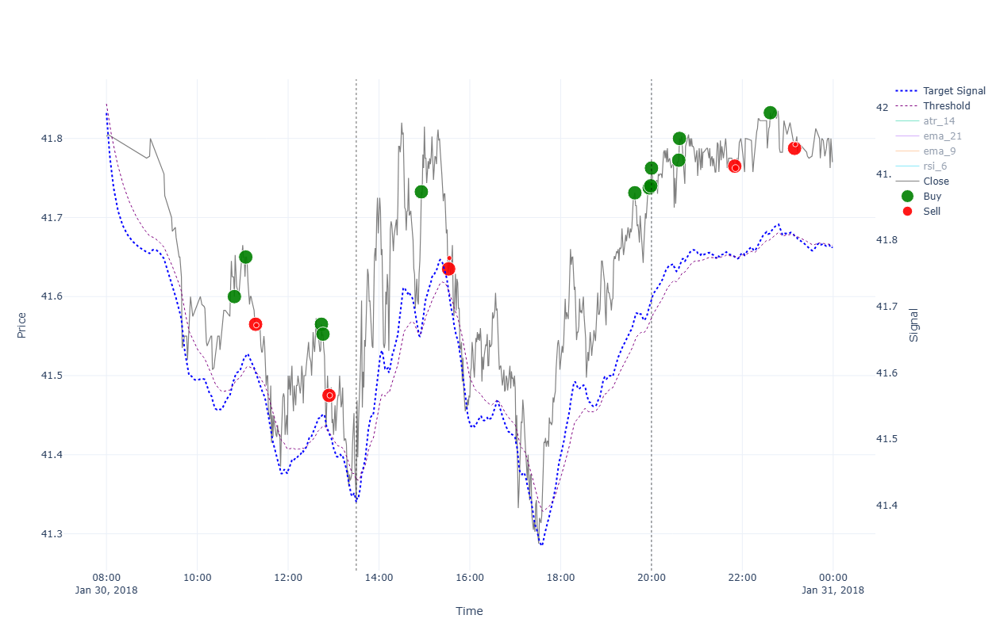


                                                  ******* Performance for 2018-01-30 *******

INTRADAY:
  shares(2098); [ask_buy=41.353, fee_buy=0.004, pos_amnt_buy=86767.563]; [bid_sell=41.754, fee_sell=0.015, pos_amnt_sell=87568.81]; leftover=4.761; PNL=801.247
TRADES:
  Tr[1]: Time(10:49)Ask(41.608)Bid(41.592)Act(Buy)Shrs(90)Pos(90); CashTr(-3745.109)=Cost(-3744.749)-Fee(-0.36); P&L(91310.362)=CashTot(87567.111)+PosAmt(3743.251)
  Tr[2]: Time(11:04)Ask(41.658)Bid(41.642)Act(Buy)Shrs(86)Pos(176); CashTr(-3582.96)=Cost(-3582.616)-Fee(-0.344); P&L(91313.086)=CashTot(83984.151)+PosAmt(7328.935)
  Tr[3]: Time(11:17)Ask(41.573)Bid(41.557)Act(Sell)Shrs(173)Pos(3); CashTr(7186.717)=Cost(7189.305)-Fee(-2.588); P&L(91295.538)=CashTot(91170.868)+PosAmt(124.67)
  Tr[4]: Time(11:18)Ask(41.572)Bid(41.555)Act(Sell)Shrs(3)Pos(0); CashTr(124.621)=Cost(124.666)-Fee(-0.045); P&L(91295.489)=CashTot(91295.489)+PosAmt(0.0)
  Tr[5]: Time(12:44)Ask(41.573)Bid(41.557)Act(Buy)Shrs(90)Pos(90); CashTr(-3741.9

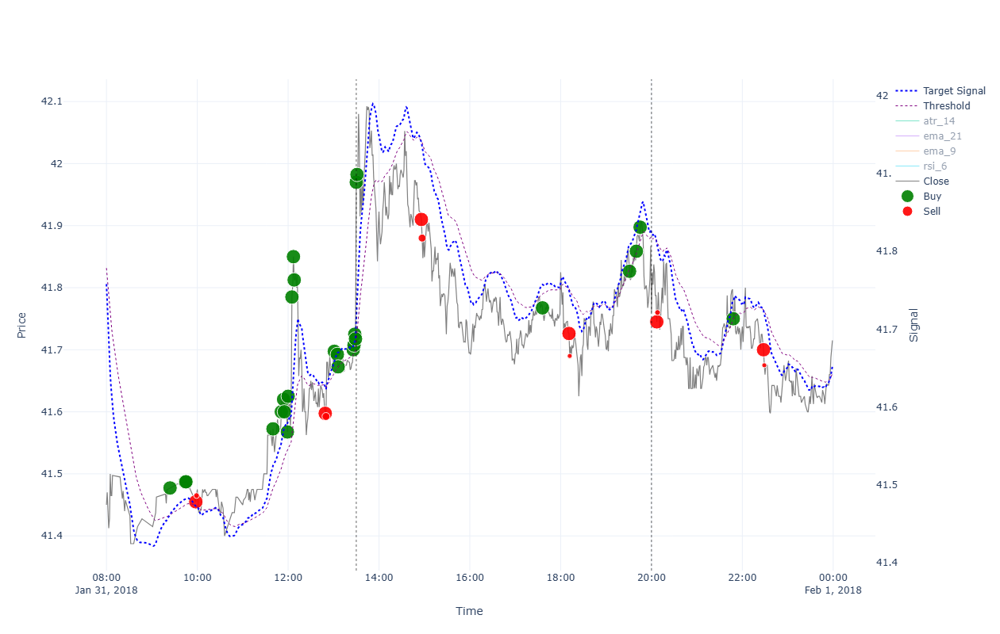


                                                  ******* Performance for 2018-01-31 *******

INTRADAY:
  shares(2085); [ask_buy=41.978, fee_buy=0.004, pos_amnt_buy=87533.304]; [bid_sell=41.752, fee_sell=0.015, pos_amnt_sell=87020.988]; leftover=40.267; PNL=-512.316
TRADES:
  Tr[1]: Time(09:24)Ask(41.486)Bid(41.469)Act(Buy)Shrs(90)Pos(90); CashTr(-3734.06)=Cost(-3733.7)-Fee(-0.36); P&L(91240.608)=CashTot(87508.402)+PosAmt(3732.206)
  Tr[2]: Time(09:44)Ask(41.495)Bid(41.479)Act(Buy)Shrs(86)Pos(176); CashTr(-3568.94)=Cost(-3568.596)-Fee(-0.344); P&L(91239.714)=CashTot(83939.463)+PosAmt(7300.251)
  Tr[3]: Time(09:45)Ask(41.496)Bid(41.479)Act(Buy)Shrs(83)Pos(259); CashTr(-3444.463)=Cost(-3444.131)-Fee(-0.332); P&L(91238.048)=CashTot(80495.0)+PosAmt(10743.048)
  Tr[4]: Time(09:58)Ask(41.463)Bid(41.447)Act(Sell)Shrs(255)Pos(4); CashTr(10565.094)=Cost(10568.908)-Fee(-3.814); P&L(91225.881)=CashTot(91060.094)+PosAmt(165.787)
  Tr[5]: Time(09:59)Ask(41.473)Bid(41.457)Act(Sell)Shrs(4)Pos(0); Ca

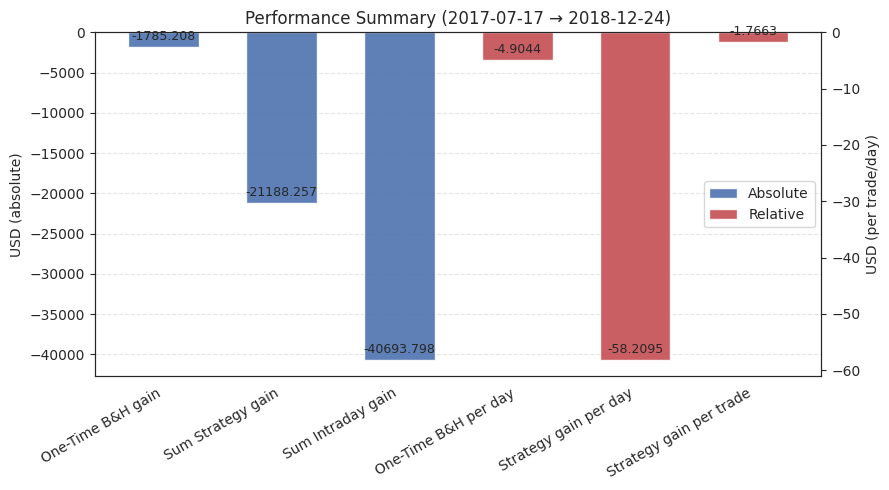

Rolling monthly summary (each metric carries its own capital forward):

Monthly Summary 2017-07 (2017-07-17 = 37.307 → 2017-07-31 = 37.020)
Num. trading days: 11  Trades Count: 377
One-Time B&H gain: -405.311 | start: 100000.000 | final: 99594.689 | PnL%: -0.41%
Sum Strategy gain: -1338.389 | start: 100000.000 | final: 98661.611 | PnL%: -1.34%
Sum Intraday gain: -1801.149 | start: 100000.000 | final: 98198.851 | PnL%: -1.80%

Monthly Summary 2017-08 (2017-08-01 = 37.020 → 2017-08-31 = 41.042)
Num. trading days: 23  Trades Count: 764
One-Time B&H gain: 10228.588 | start: 99594.689 | final: 109823.277 | PnL%: 10.27%
Sum Strategy gain: 364.136 | start: 98661.611 | final: 99025.747 | PnL%: 0.37%
Sum Intraday gain: -1172.512 | start: 98198.851 | final: 97026.339 | PnL%: -1.19%

Monthly Summary 2017-09 (2017-09-01 = 41.042 → 2017-09-29 = 38.517)
Num. trading days: 20  Trades Count: 544
One-Time B&H gain: -6571.208 | start: 109823.277 | final: 103252.069 | PnL%: -5.98%
Sum Strategy gain: -155

In [11]:
importlib.reload(params) ######
importlib.reload(strategies) ######

year, month = map(int, params.month_to_check.split("-"))
dates_in_month = [date for date in sim_results if date.year == year and date.month == month]

if not dates_in_month:
    print(f"No simulation data for {params.month_to_check}")
else:
    for date in sorted(dates_in_month):
        df_at_date_plot, trades_at_date, stats_at_date = sim_results[date]
        plots.plot_trades(
            df                 = df_at_date_plot,
            col_signal1        = col_signal,
            sign_thresh        = sign_thresh, 
            axis_sig_thresh    = 'second',
            trades             = trades_at_date,
            performance_stats  = stats_at_date,
            features           = ['ema_9','ema_21','rsi_6', 'atr_14', 'vwap_14', 'rsi_thresh'],
            autoscale          = False
        )
        
        print(f"\n{' ' * 50}******* Performance for {date.strftime('%Y-%m-%d')} *******\n")
        for k,v in stats_at_date.items(): # Print stats dict for each date nicely
            print(f"{k}:\n" + "\n".join("  "+L for L in (v if isinstance(v,list) else str(v).splitlines())))
        print("\n" + "="*160 + "\n")

# final visualizations and monthly aggregations
strategies.aggregate_performance(df = df_inds,
                                 sim_results = sim_results,
                                 sess_start = sess_start)
